# Analysis of mouse single cell hematopoietic populations - Analysis of single cells using SCANPY

__Author__: Elisabeth F. Heuston

## Purpose

Single cell transcriptional and clustering analysis of LSK, CMP, MEP, and GMP

This notebook contains the workflow to analyze data from Scanpy-derived analyses and pertains to:

Raw data for this publication are available to download from the GEO Project GSE168260 at https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE168259  

__Scanpy - Single Cell Analysis in Python__ documentation and tutorials are available at https://scanpy.readthedocs.io/en/stable/  
__anndata - Annotated Data__ documentation and tutorials are available at https://anndata.readthedocs.io/en/latest

## Workbook setup

### Import python3.7 modules

In [1]:
import numpy as np
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import sys, os
import matplotlib
import matplotlib.pyplot as plt
import glob, csv, re, warnings
from pathlib import Path

### Define module settings

In [2]:
matplotlib.rcParams['figure.figsize'] = [4.83, 2.72]

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=150, color_map='viridis')
sc.set_figure_params(scanpy = False, dpi_save=300, frameon=False, vector_friendly=True, transparent=True)

In [3]:
sc.logging.print_header()

scanpy==1.8.2 anndata==0.7.8 umap==0.3.10 numpy==1.20.2 scipy==1.6.2 pandas==1.2.5 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


### Set global variables

In [444]:
working_dir = '/Users/heustonef/Desktop/10XGenomicsData/msAggr_scRNASeq/Scanpy/'
singleCell_dir = '/Users/heustonef/Desktop/10XGenomicsData/cellRanger/'
base_title = "scRNAanalysis"
number_neighbors = 20
random_seed = 1
number_pcs = 30

In [404]:
os.chdir(working_dir) # set working directory

## Create anndata object

For this analysis Scanpy requires matrix, gene, and barcode files generated by cellranger v6.0.1 

### Load single cell data

In [405]:
lskdata = sc.read_10x_h5(filename=os.path.join(singleCell_dir, 'LSKm2/filtered_feature_bc_matrix.h5'), genome='mm10')
lskdata.var_names_make_unique()
lskdata.obs['orig_ident'] = 'LSK'

reading /Users/heustonef/Desktop/10XGenomicsData/cellRanger/LSKm2/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [406]:
cmpdata = sc.read_10x_h5(filename=os.path.join(singleCell_dir, 'CMPm2/filtered_feature_bc_matrix.h5'), genome='mm10')
cmpdata.var_names_make_unique()
cmpdata.obs['orig_ident'] = 'CMP'

reading /Users/heustonef/Desktop/10XGenomicsData/cellRanger/CMPm2/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [407]:
mepdata = sc.read_10x_h5(filename=os.path.join(singleCell_dir, 'MEPm/filtered_feature_bc_matrix.h5'), genome='mm10')
mepdata.var_names_make_unique()
mepdata.obs['orig_ident'] = 'MEP'

reading /Users/heustonef/Desktop/10XGenomicsData/cellRanger/MEPm/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [408]:
gmpdata = sc.read_10x_h5(filename=os.path.join(singleCell_dir, 'GMPm/filtered_feature_bc_matrix.h5'), genome='mm10')
gmpdata.var_names_make_unique()
gmpdata.obs['orig_ident'] = 'GMP'

reading /Users/heustonef/Desktop/10XGenomicsData/cellRanger/GMPm/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### Create concatenated object

In [534]:
msdata = lskdata.concatenate([cmpdata, mepdata, gmpdata])

## Read filtering and quality control

In [535]:
# match seurat cell filters
sc.pp.filter_cells(msdata, min_genes=900)
sc.pp.filter_cells(msdata, max_genes=4000)
sc.pp.filter_genes(msdata, min_cells=3)

filtered out 3323 cells that have less than 900 genes expressed
filtered out 1096 cells that have more than 4000 genes expressed
filtered out 13739 genes that are detected in less than 3 cells


From https://hbctraining.github.io/scRNA-seq/lessons/04_SC_quality_control.html:
> The UMI counts per cell should generally be above 500, that is the low end of what we expect. If UMI counts are between 500-1000 counts, it is usable but the cells probably should have been sequenced more deeply.

In [536]:
sc.pp.filter_cells(msdata, min_counts=500)

In [537]:
msdata.var['mt'] = msdata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(msdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'orig_ident' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


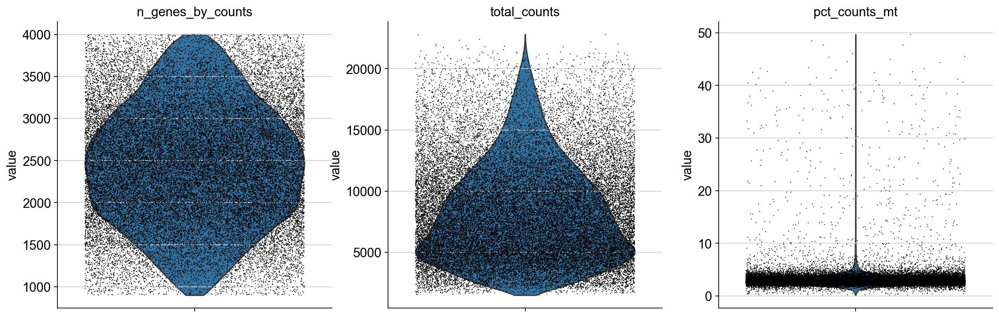

In [538]:
sc.pl.violin(msdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

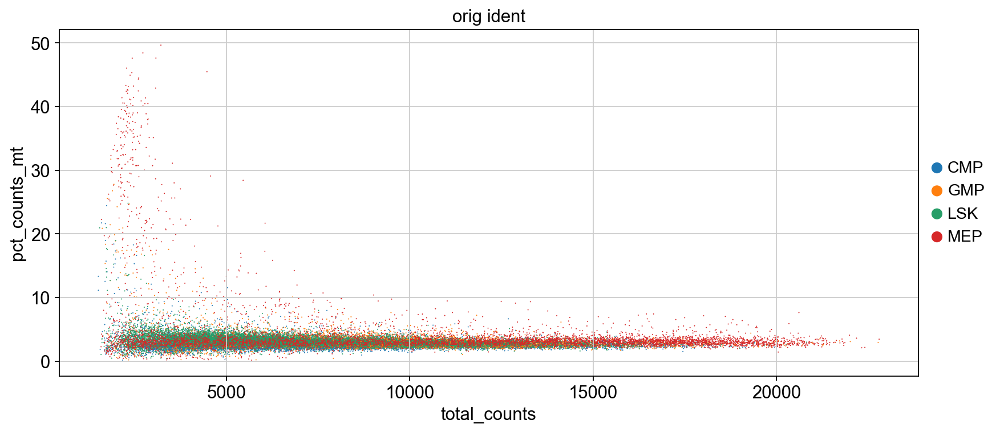

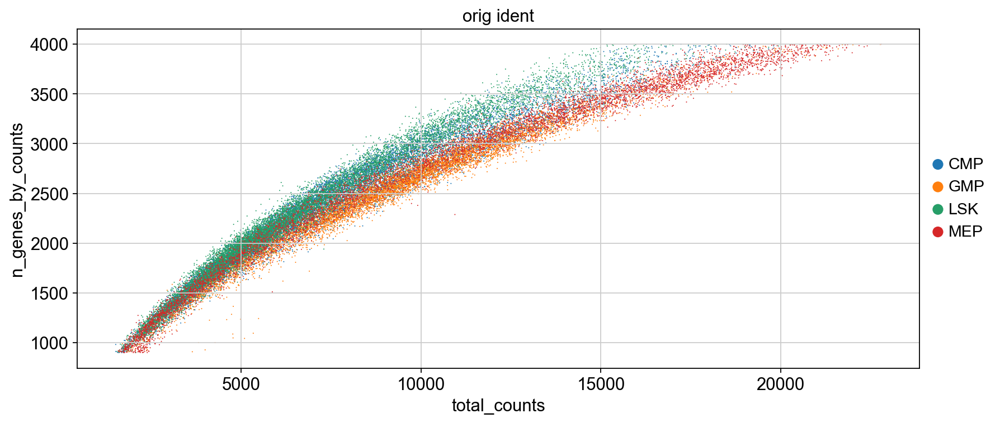

In [539]:
sc.pl.scatter(msdata, x='total_counts', y='pct_counts_mt', color = 'orig_ident')
sc.pl.scatter(msdata, x='total_counts', y='n_genes_by_counts', color = 'orig_ident')

In [540]:
msdata = msdata[msdata.obs.pct_counts_mt < 5, :]

In [541]:
sc.pp.normalize_total(msdata, target_sum=1e4)
sc.pp.log1p(msdata)

/Users/heustonef/opt/anaconda3/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


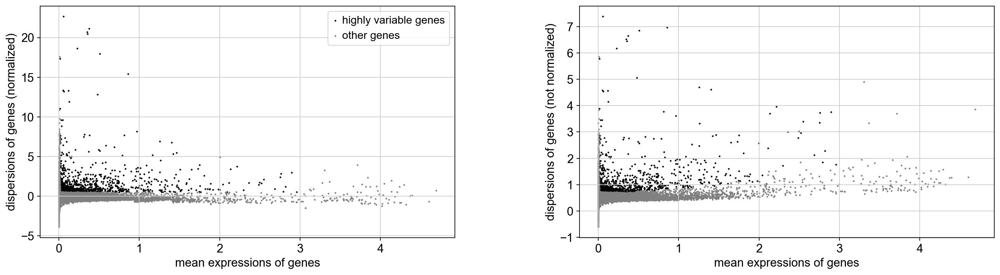

In [542]:
sc.pp.highly_variable_genes(msdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(msdata)

In [543]:
#save filtered high-dispersion msdata subset as msdata
msdata = msdata[:, msdata.var.highly_variable]

In [544]:
msdata.obs_keys()

['orig_ident',
 'batch',
 'n_genes',
 'n_counts',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt']

In [545]:
# sc.pp.regress_out(msdata, ['total_counts','pct_counts_mt'])
sc.pp.regress_out(msdata, ['n_counts', 'n_genes']) # Match regression parameters used in Seurat

regressing out ['n_counts', 'n_genes']
    sparse input is densified and may lead to high memory use
    finished (0:00:17)


In [546]:
sc.pp.scale(msdata, max_value=10)

## Dimensional reduction

### PCA

In [547]:
sc.tl.pca(msdata, n_comps=30) # PCA required for FDG

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:02)


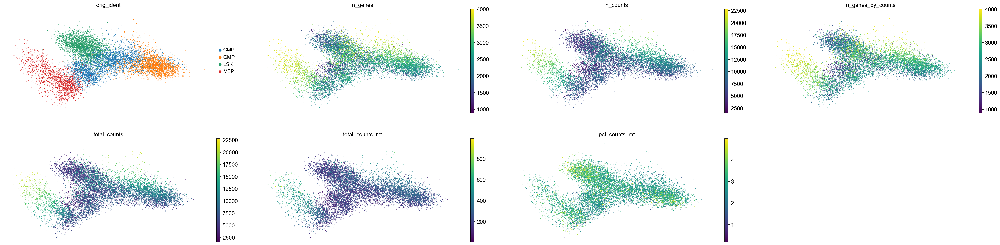

In [548]:
data_obs = msdata.obs_keys()
data_obs.remove('batch')
sc.pl.pca_scatter(msdata, color = data_obs)

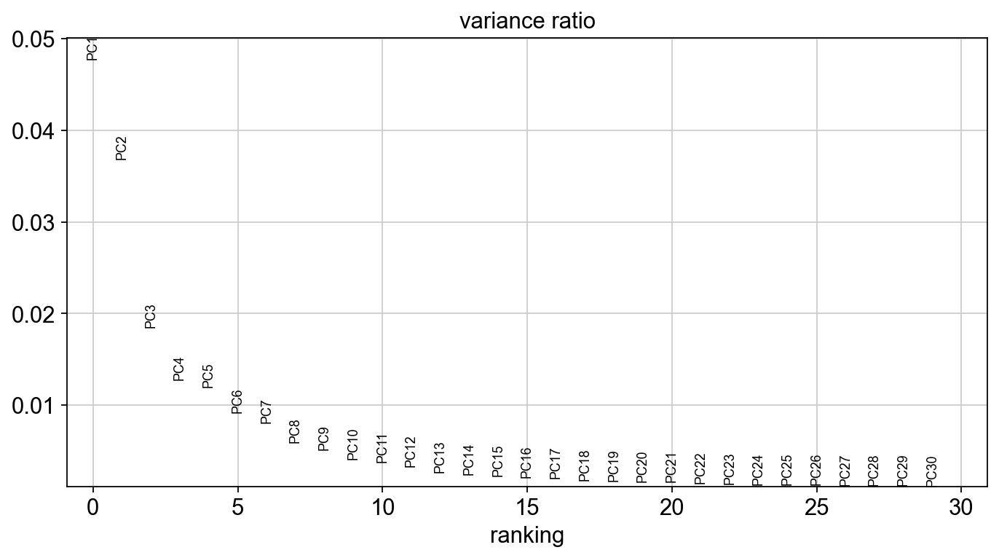

In [549]:
sc.pl.pca_variance_ratio(msdata)

In [550]:
msdata.write(filename="msAggr_Scanpy_pca.h5ad")

### Clustering analysis

#### Neighborhood analysis

In [551]:
msdata = sc.read(filename="msAggr_Scanpy_pca.h5ad")

In [555]:
num_pcs = 16

In [552]:
sc.pp.neighbors(msdata, n_neighbors=number_neighbors, n_pcs=num_pcs)

computing neighbors
    using 'X_pca' with n_pcs = 16


/Users/heustonef/opt/anaconda3/lib/python3.7/site-packages/numba/core/typed_passes.py:327: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


#### UMAP

In [553]:
sc.tl.umap(msdata, random_state=random_seed)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)


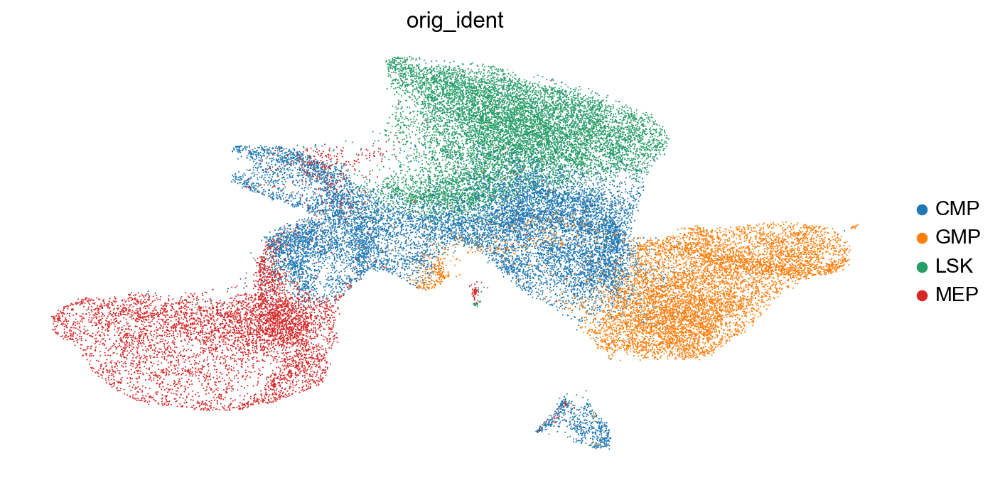

In [554]:
sc.pl.umap(msdata, color=['orig_ident'])

#### Leiden clustering

In [557]:
results_file = "msAggr_Scanpy_ndim" + str(num_pcs) + "nneigh" + str(number_neighbors) + "-umap.h5ad"
msdata.write(filename=results_file)

### Trajectory analysis

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:04:11)
computing Diffusion Maps using n_comps=20(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99830294 0.9974656  0.9960305  0.9930193  0.9916405
     0.9898753  0.9875576  0.98592955 0.9824459  0.9808205  0.9763363
     0.9755502  0.97296053 0.9720748  0.9719674  0.96943533 0.96796995
     0.9668865  0.9660304 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)
computing neighbors


/Users/heustonef/opt/anaconda3/lib/python3.7/site-packages/numba/core/typed_passes.py:327: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:04:02)


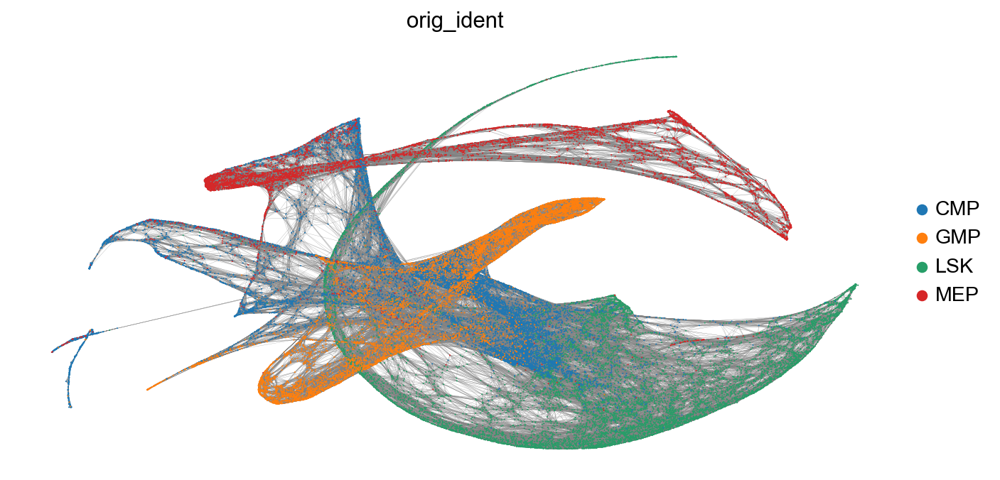

In [566]:
msdata = sc.read(results_file)

sc.tl.draw_graph(msdata, random_state=20)

# Now denoise the graph and recalculate neighborhoods

sc.tl.diffmap(msdata, n_comps=20, random_state=random_seed)
sc.pp.neighbors(msdata, n_neighbors=number_neighbors, n_pcs = 20, use_rep = 'X_diffmap')

sc.tl.draw_graph(msdata, random_state = 20)

sc.pl.draw_graph(msdata, color = ['orig_ident'], edges=True)

### Overlay Seurat cluster IDs

#### Import cellids from seurat

Download and unzip __SingleCellClusterIDs__ 

In [569]:
seurat_metadata = pd.read_csv("/Users/heustonef/Desktop/10XGenomicsData/msAggr_scRNASeq/msAggr_seurat/msAggr_SeuratMetaData.txt", sep = "\t")

seurat_metadata.index = seurat_metadata.index.str.replace('.*_', '')

new_list = []
for x in range(seurat_metadata.shape[0]):
    if seurat_metadata.iloc[x]["orig.ident"] == "LSKm2":
        new_list.append(''.join((seurat_metadata.index[x], '-0')))
    elif seurat_metadata.iloc[x]["orig.ident"] == "CMPm2":
        new_list.append(''.join((seurat_metadata.index[x], '-1')))
    elif seurat_metadata.iloc[x]["orig.ident"] == "MEPm":
        new_list.append(''.join((seurat_metadata.index[x], '-2')))
    elif seurat_metadata.iloc[x]["orig.ident"] == "GMPm":
        new_list.append(''.join((seurat_metadata.index[x], '-3')))
    else:
        print("failboat")
seurat_metadata.index = new_list

/Users/heustonef/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


In [570]:
seurat_metadata.head()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters,RNA_snn_res.1,RNA_snn_res.1.5,RNA_snn_res.2,RNA_snn_res.2.5
AAACATACCGACAT-1-0,LSKm2,3946,1645,4.485555,5,3,9,8,5,3
AAACATACCTAAGC-1-0,LSKm2,2834,1321,1.693719,0,1,0,0,1,1
AAACATACGAAACA-1-0,LSKm2,7607,2583,3.339030,0,5,0,2,3,5
AAACATACGATACC-1-0,LSKm2,11269,3210,3.026001,5,3,9,8,5,3
AAACATACGTAGGG-1-0,LSKm2,5616,2238,3.062678,0,27,1,6,3,27


In [571]:
msdata.obs = msdata.obs.join(seurat_metadata['RNA_snn_res.1'], on = msdata.obs.index)

In [572]:
msdata.obs['RNA_snn_res.1'] = msdata.obs['RNA_snn_res.1'].astype("category")

In [580]:
SeuratColourPalette = [
  "#cb4bbe", # cluster_0
  "#87CEF9", # cluster_1
  "#5F5F5F", # cluster_2
  "#53ba48", # cluster_3
  "#FCE4B5", # cluster_4
  "#dcca44", # cluster_5
  "#502d70", # cluster_6
  "#afd671", # cluster_7
  "#cb4471", # cluster_8
  "#69da99", # cluster_9
  "#d44732", # cluster_10
  "#6fd3cf", # cluster_11
  "#5d2539", # cluster_12
  "#cfd0a0", # cluster_13
  "#1F33FE", # cluster_14
  "#d2883b", # cluster_15
  "#6793c0", # cluster_16
  "#898938", # cluster_17
  "#c98ac2", # cluster_18
  "#FDFB03", # cluster_19
  "#c4c0cc", # cluster_20
  "#7d3d23", # cluster_21
  "#00a5ff", # cluster_22
  "#d68d7a", # cluster_23
  "#a2c1a3", # cluster_24
  "#000000", # cluster_25
  "#008000", # cluster_26
  "#00FF00", # cluster_27
  "#000080", # cluster_28
  "#515252", # cluster_29
  "#80FF80", # cluster_30
  "#8000FF", # cluster_31
  "#8080FF" # cluster_32
    ]

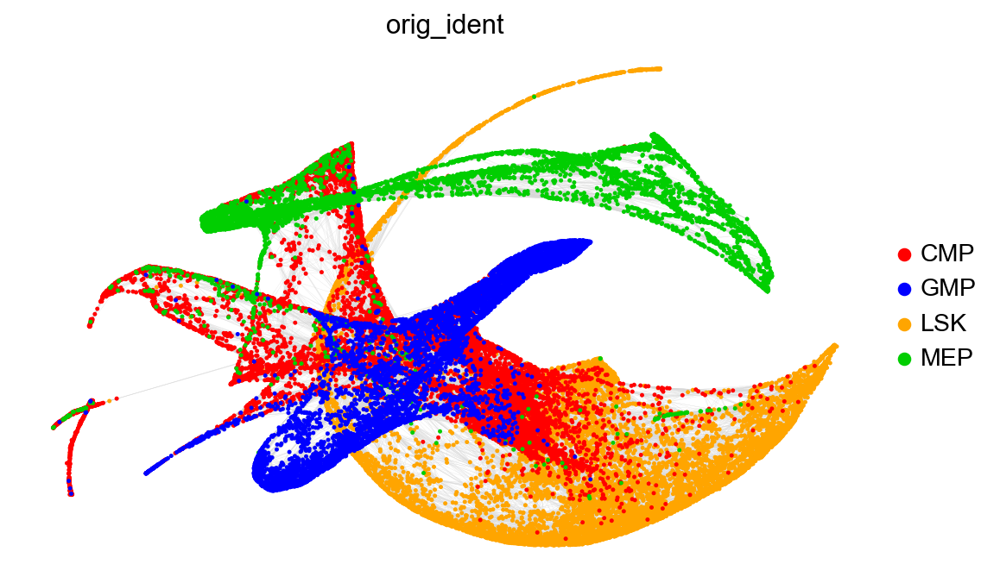

In [590]:
matplotlib.rcParams['figure.figsize'] = [8,5]
sc.pl.draw_graph(msdata, color = ['orig_ident'], edges_width=0.1, edges_color="#D7D7D7", 
                 edges=True, legend_loc='right margin', size = 20, frameon=False, palette= ['red', 'blue', 'orange', '#01ce01'],
                save = "msAggr_trajectory_ndim30-orig.ident.png")

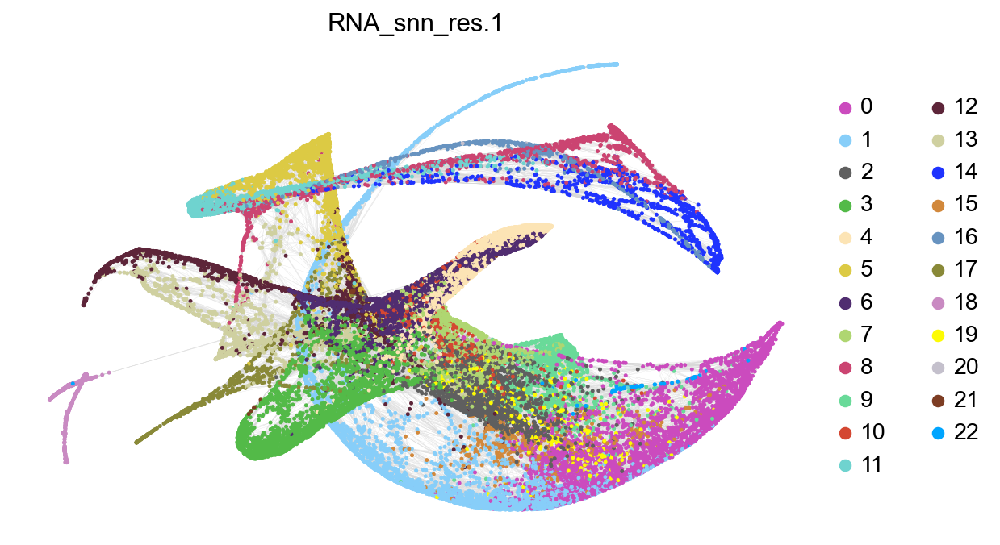

In [594]:
matplotlib.rcParams['figure.figsize'] = [8,5]
sc.pl.draw_graph(msdata, color = ['RNA_snn_res.1'], edges_width=0.1, edges_color="#D7D7D7", edges=True, legend_loc='right margin', size = 20, frameon=False, palette=SeuratColourPalette, 
                save = "msAggr_trajectory_ndim30-seuratdim26res.1.png")


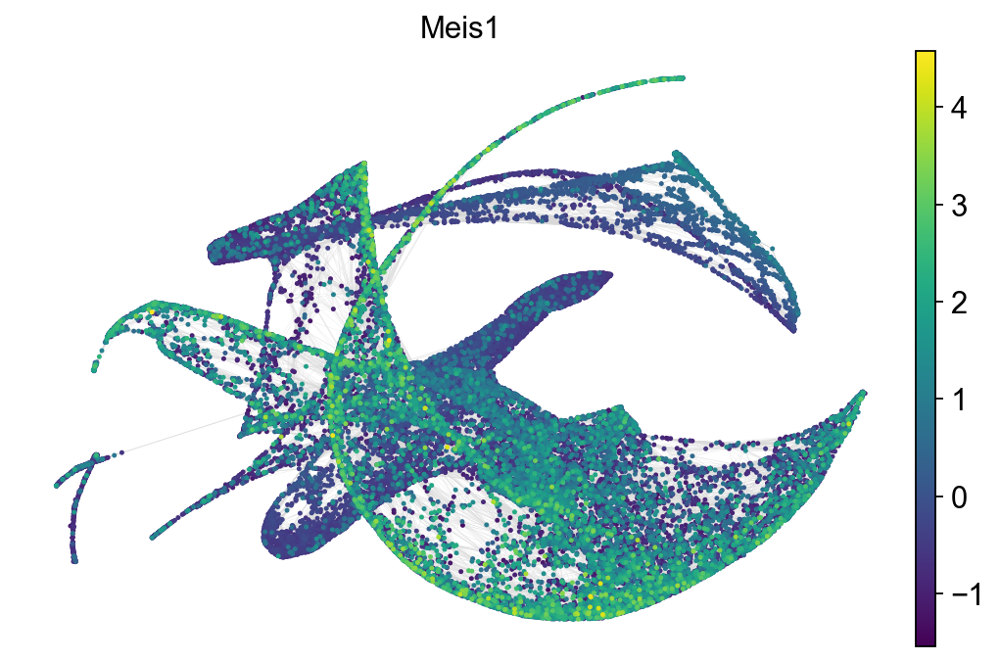

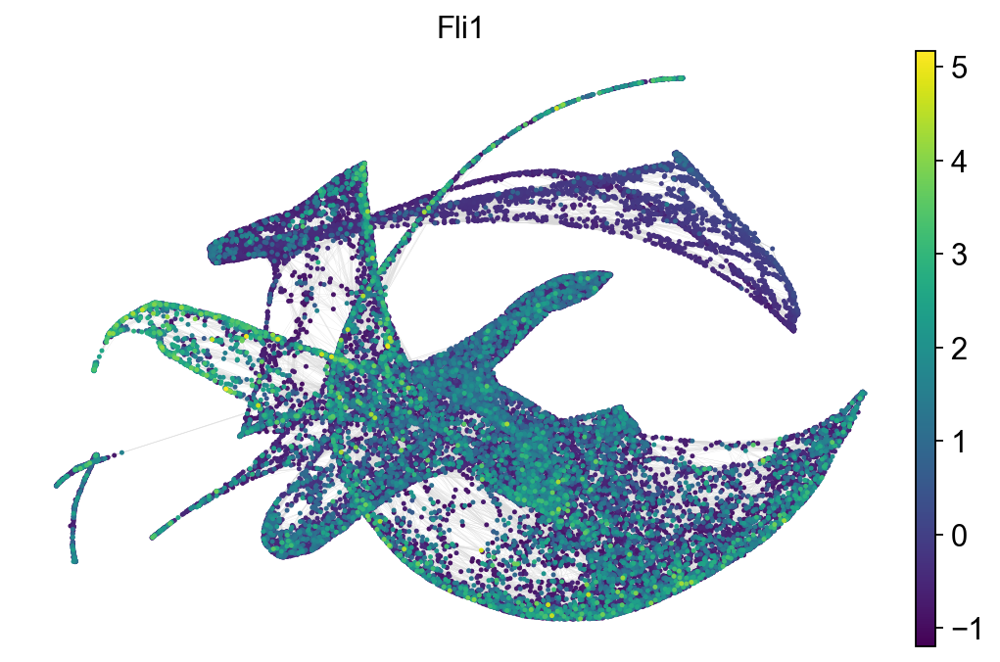

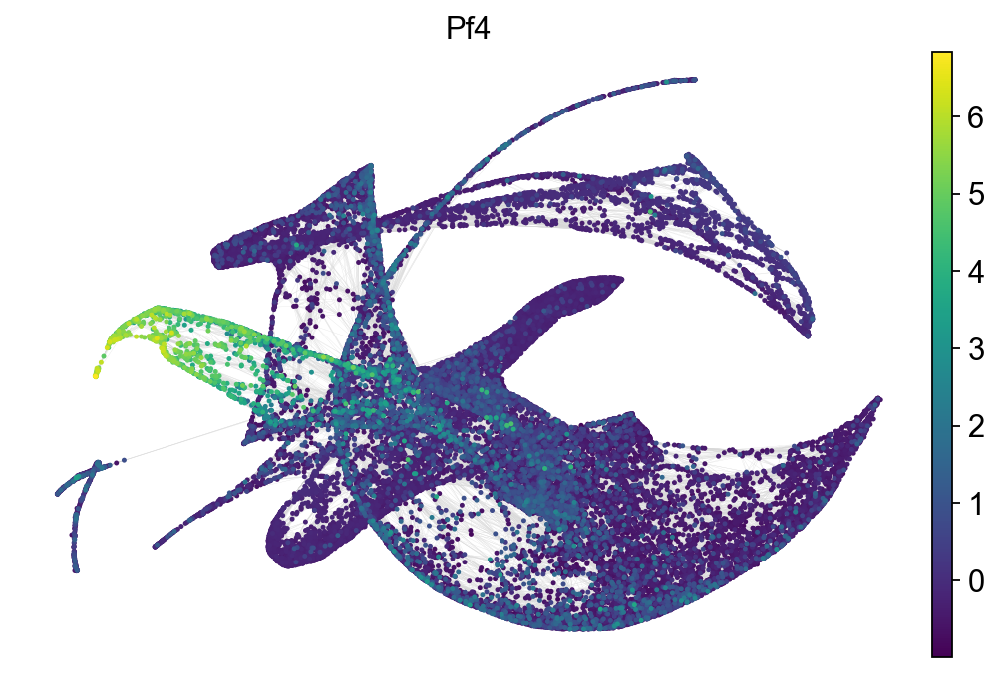

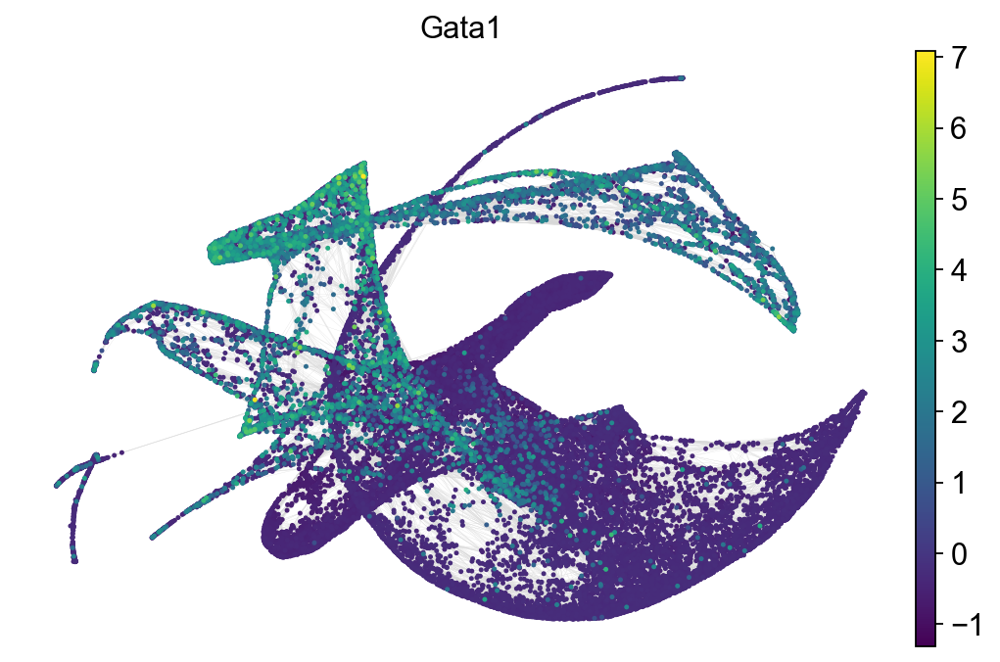

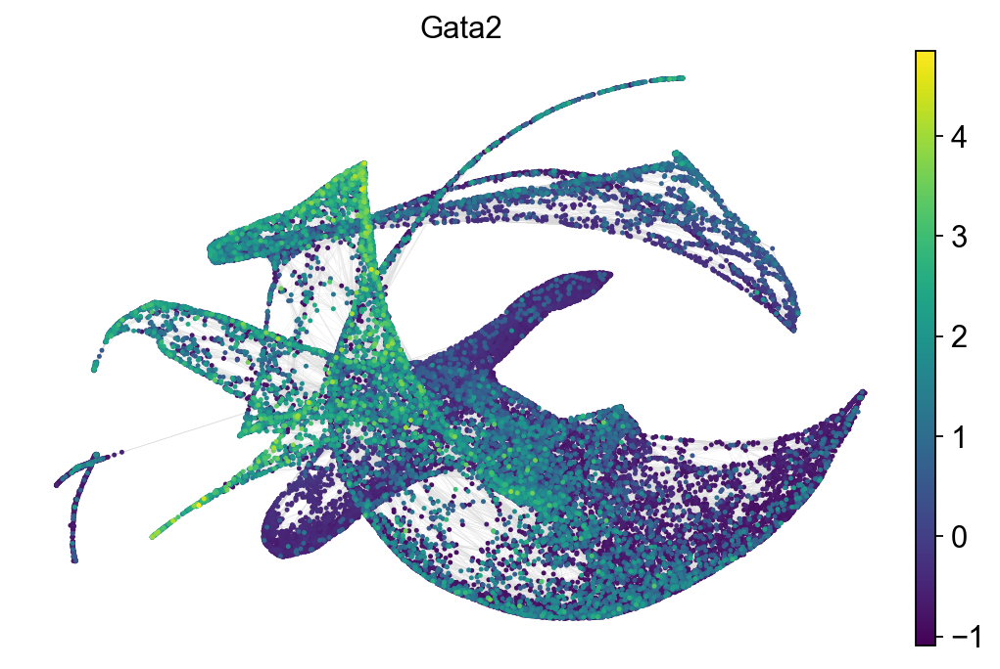

In [593]:
mk_genes =  ['Meis1', 'Fli1', 'Pf4', 'Gata1', 'Gata2']

for gene in mk_genes:
    sc.pl.draw_graph(msdata, color = gene, edges_width=0.1, edges_color="#D7D7D7", edges=True, legend_loc='right margin', 
                 size = 20, frameon=False, palette=SeuratColourPalette, ncols=1,
                save = ''.join(("msAggr_trajectory_ndim30-", gene, ".png")))


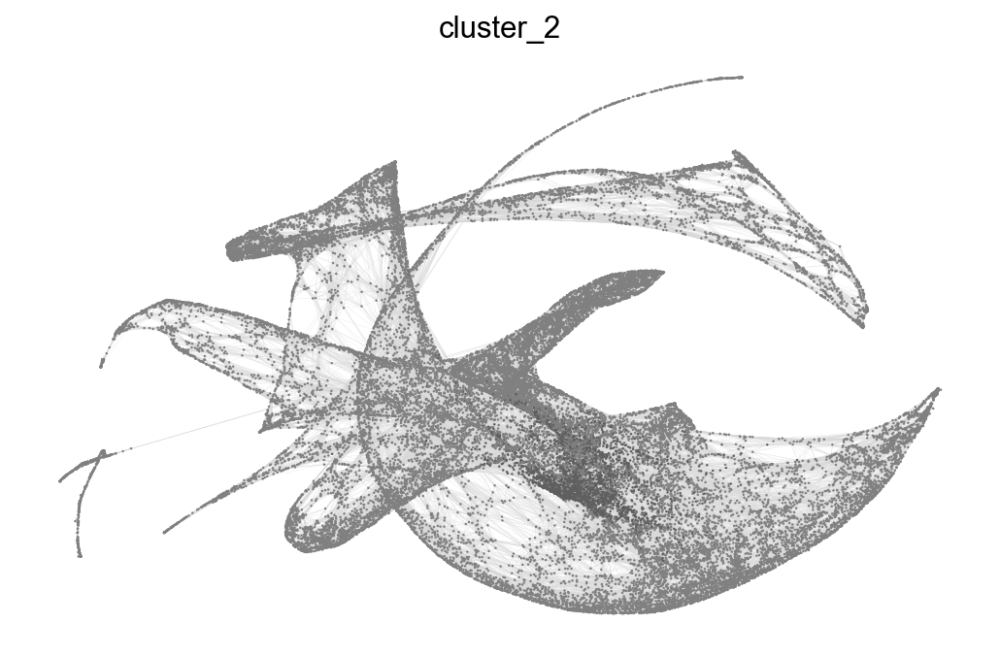

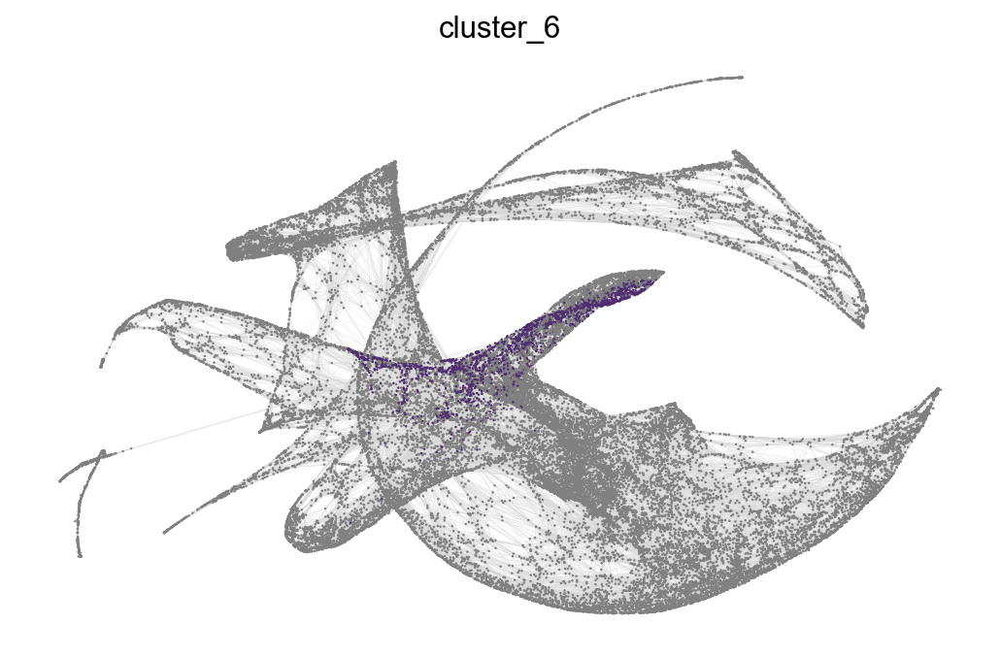

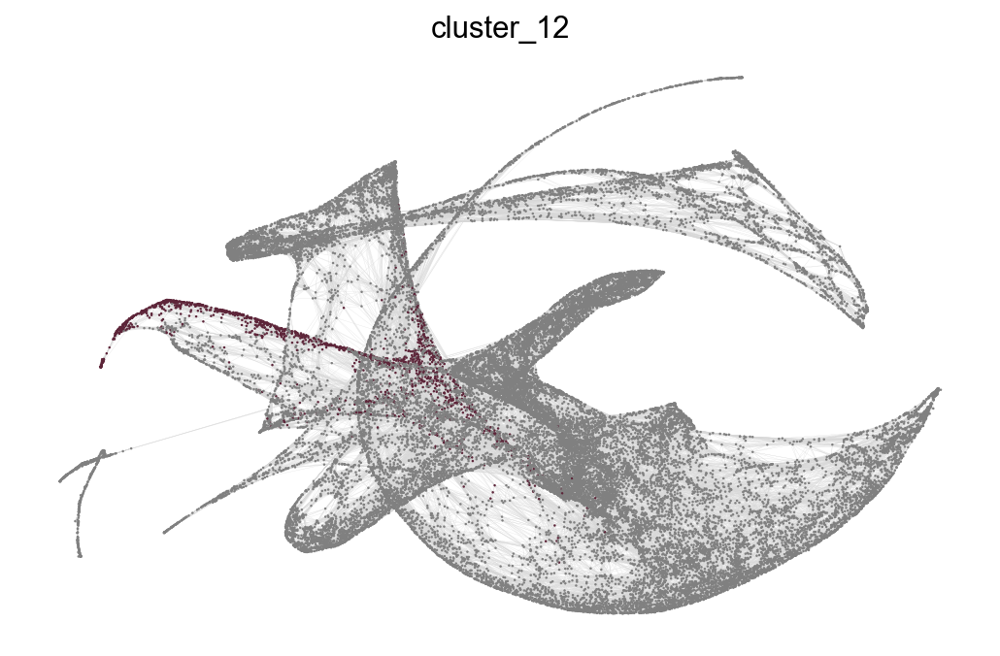

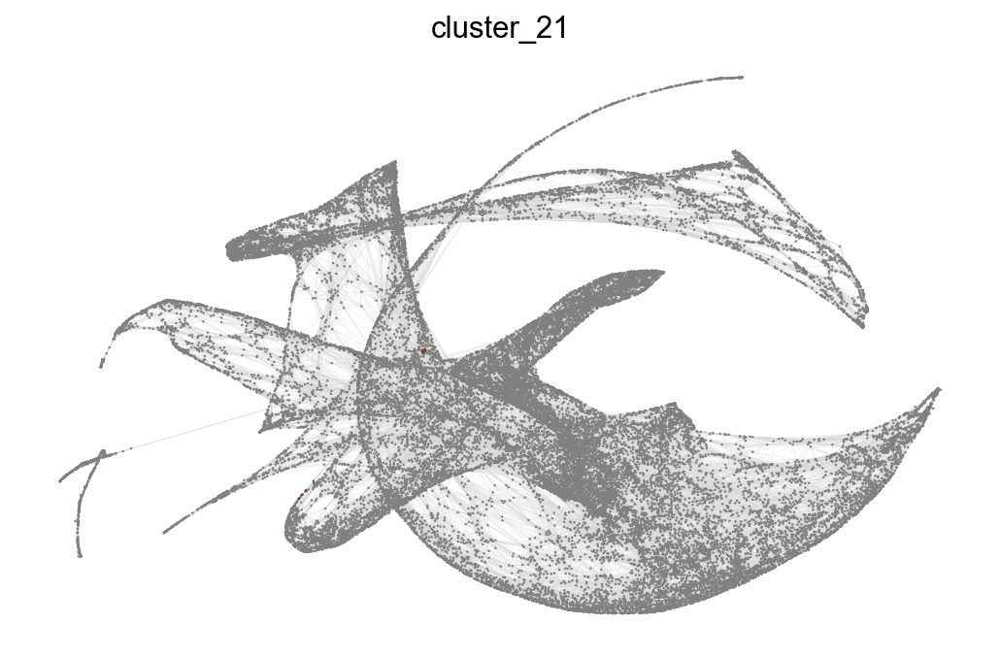

In [600]:
cluster_list = [2, 6, 12, 21]
for i in cluster_list:
    clusterEmphasisPalette = ['gray']* 33
    clusterEmphasisPalette[i] = SeuratColourPalette[i]
#     out_file = '-seuratCluster' + str(i) + '_ScanpyOverlay.png'
    sc.pl.draw_graph(msdata, color = ['RNA_snn_res.1'], edges_width=0.1, edges=True, edges_color="#D7D7D7", 
                     legend_loc='none', size = 5, frameon=False, palette=clusterEmphasisPalette, 
                     title='_'.join(['cluster', str(i)]))

## CMP partition-based graph abstraction (PAGA)

### Subset concatenated anndata object

In [42]:
cmp_subset = msdata[msdata.obs['orig_ident'] == 'CMP']
cmp_subset.obs['orig_ident'].unique() # confirm object contains only CMP ids

[CMP]
Categories (1, object): [CMP]

### Run PAGA on CMP subset

In [43]:
sc.tl.paga(cmp_subset, groups='SeuratClusterID')

running PAGA


Trying to set attribute `.uns` of view, copying.


    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


In [44]:
cmp_subset.obs.head()

,orig_ident,batch,n_genes,percent_mito,n_counts,SeuratClusterID
AAACATACAAGCCT-1-1,CMP,1,1223,0.024156,2608.0,cluster_11
AAACATACACCCTC-1-1,CMP,1,3722,0.024287,16717.0,cluster_18
AAACATACACTGTG-1-1,CMP,1,2039,0.028930,5738.0,cluster_7
AAACATACAGAAGT-1-1,CMP,1,2071,0.027330,6074.0,cluster_13
AAACATACAGAGGC-1-1,CMP,1,1849,0.027056,4657.0,cluster_17


#### Figure 4C

--> added 'pos', the PAGA positions (adata.uns['paga'])


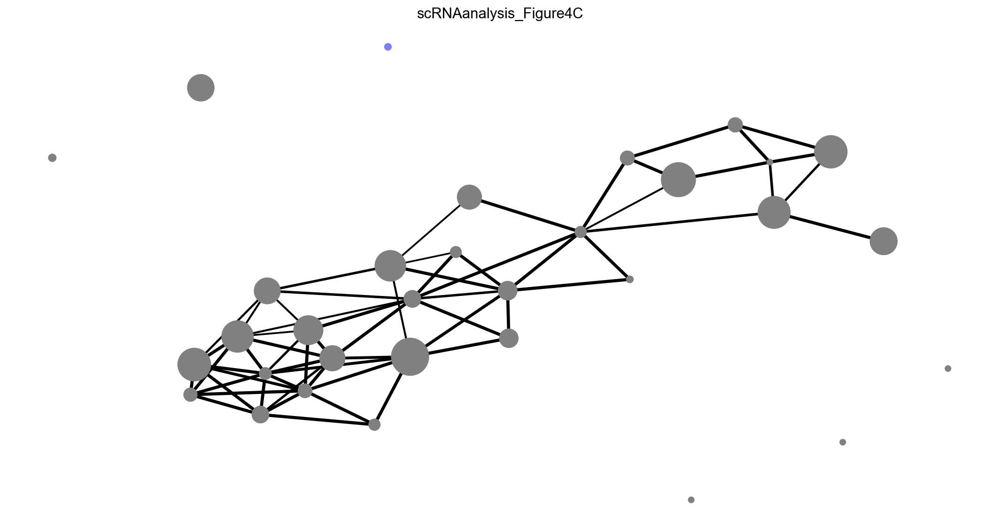

In [45]:
matplotlib.rcParams['figure.figsize'] = [14,8]
sc.pl.paga(cmp_subset, 
           color=['SeuratClusterID'], 
           labels = ['']*len(cmp_subset.obs['SeuratClusterID'].unique()),
           threshold = 0.5, 
           title = [base_title + '_Figure4C'], 
           node_size_scale=2, 
           node_size_power=0.5,
           frameon=False,
           max_edge_width=10,
           edge_width_scale = 0.4,
           save =  base_title + '_Figure4C.png'
           )

--> added 'pos', the PAGA positions (adata.uns['paga'])


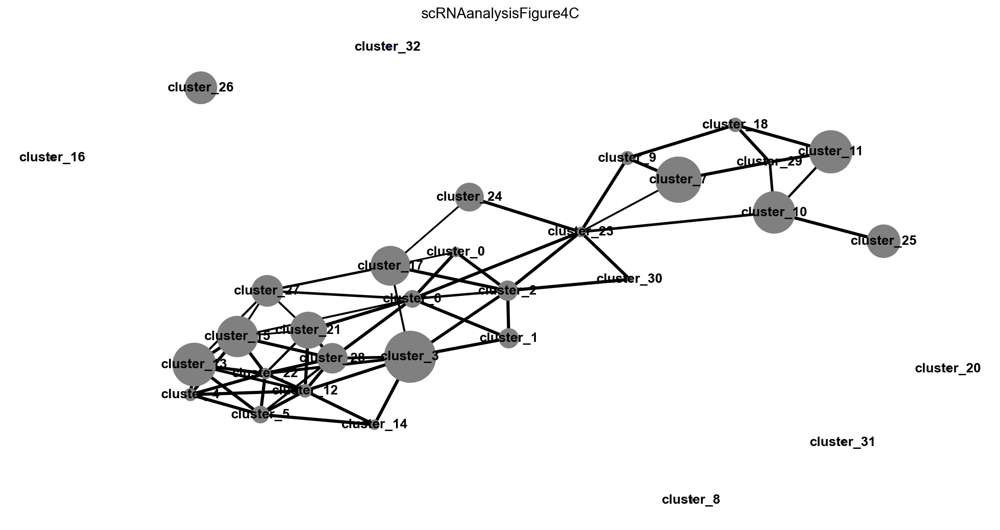

In [46]:
matplotlib.rcParams['figure.figsize'] = [14,8]
sc.pl.paga(cmp_subset, 
           color=['SeuratClusterID'], 
           threshold = 0.5, 
           title = [base_title + 'Figure4C'], 
           node_size_scale=2, 
           node_size_power=0.7,
           frameon=False,
           max_edge_width=10,
           edge_width_scale = 0.4,
           save =  base_title + '_Figure4C_labeled.png'
           )

# Session information

In [ ]:
sc.logging.print_versions()